# imports


In [1]:
import sys

sys.path.append("../../../")

from SEAM.utils import *
import SEAM
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import SIMLR

In [2]:
import imp
imp.reload(SEAM)
imp.reload(SIMLR)

<module 'SIMLR' from '../../../SIMLR/__init__.py'>

# settings


In [3]:
sns.set_style("white")
# font = {'family' : 'normal',
#         'weight' : 'bold',
#         'size'   : 2}

# matplotlib.rc('font', **font)
# matplotlib.rcParams.update({'font.size': 2})

import matplotlib.pyplot as plt

SMALL_SIZE = 8
MEDIUM_SIZE = 10
BIGGER_SIZE = 12

plt.rc("font", size=SMALL_SIZE)  # controls default text sizes
plt.rc("axes", titlesize=SMALL_SIZE)  # fontsize of the axes title
plt.rc("axes", labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc("xtick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("ytick", labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc("legend", fontsize=SMALL_SIZE)  # legend fontsize
plt.rc("figure", titlesize=BIGGER_SIZE)  # fontsize of the figure title



# load


### load raw and segmented data from data/process/


In [4]:
a = sc.read_h5ad("../../data/raw_tar/mouse_liver_raw.h5ad")



In [5]:
a


AnnData object with n_obs × n_vars = 724 × 244
    uns: 'IMS', 'cell_idx', 'cell_pos', 'train_x'

### display raw ion image data


256 256


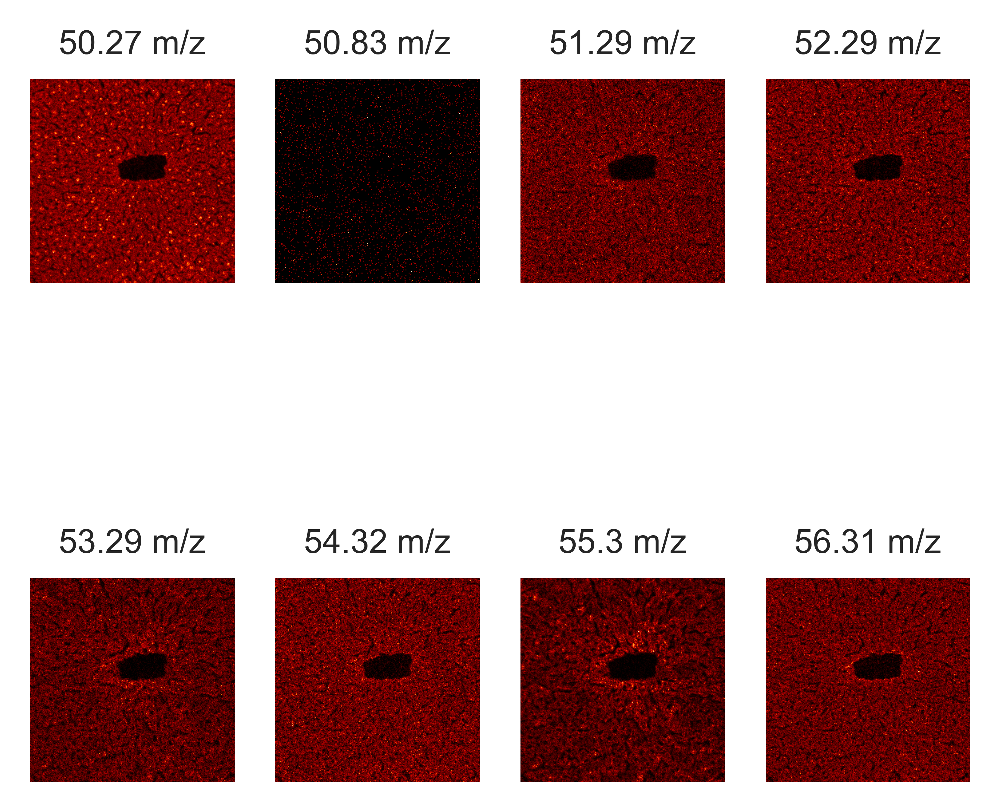

In [6]:
SEAM.pl.IMS(a, list(a.var_names[:8]), n_cols=4)



# View


### run SIMS-View with DR_method=Umap


In [7]:
a = SEAM.tl.View(a, method="Umap")



(65536,)


### show result of SIMS-View


In [8]:
SEAM.pl.View(a, method="Umap")



(65536, 3) (65536,) (65536, 3)


/Users/david/Code/miniconda3/envs/seam/lib/python3.8/site-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 5528 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


# Cut


### get segmented mask and cell position, and write into anndata


In [9]:
a = SEAM.tl.Cut(a)



setting obsm: spatial


## each cell represented as a dot


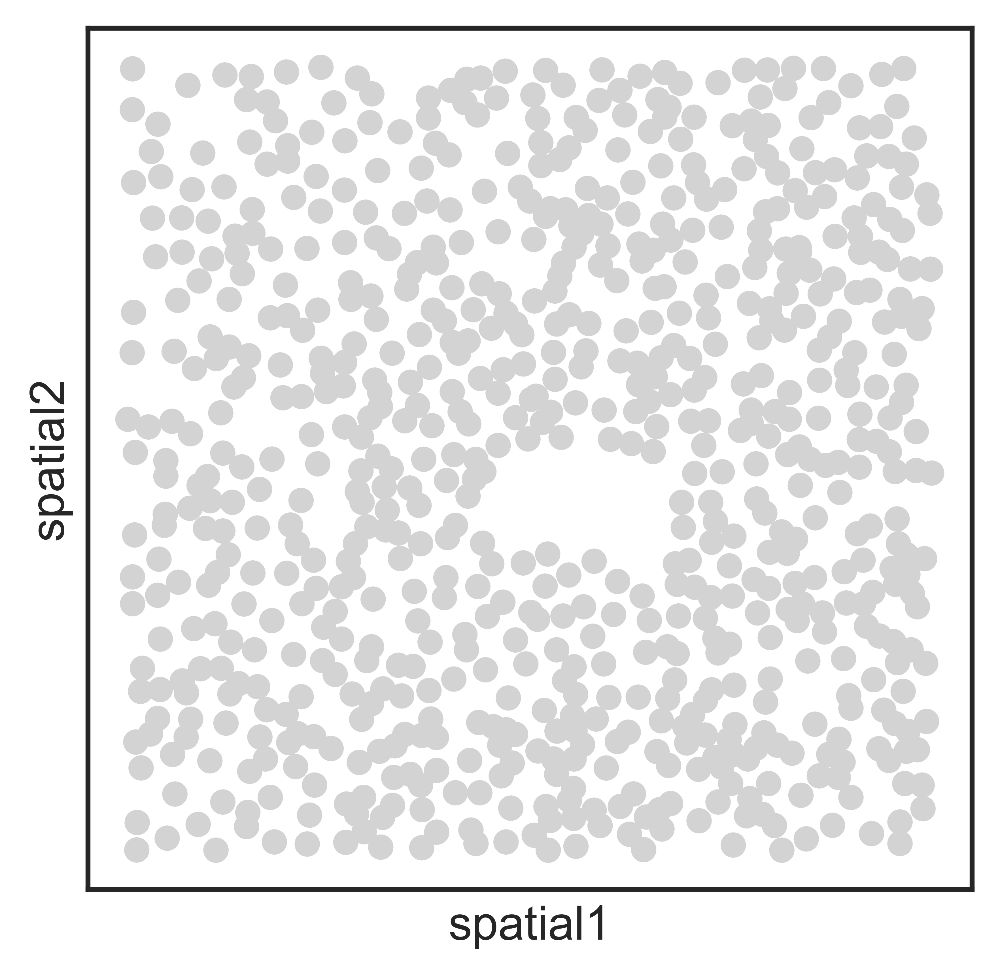

In [10]:
SEAM.pl.Cut(a, method="dot", save=False)



## each cell represented as a segmented mask


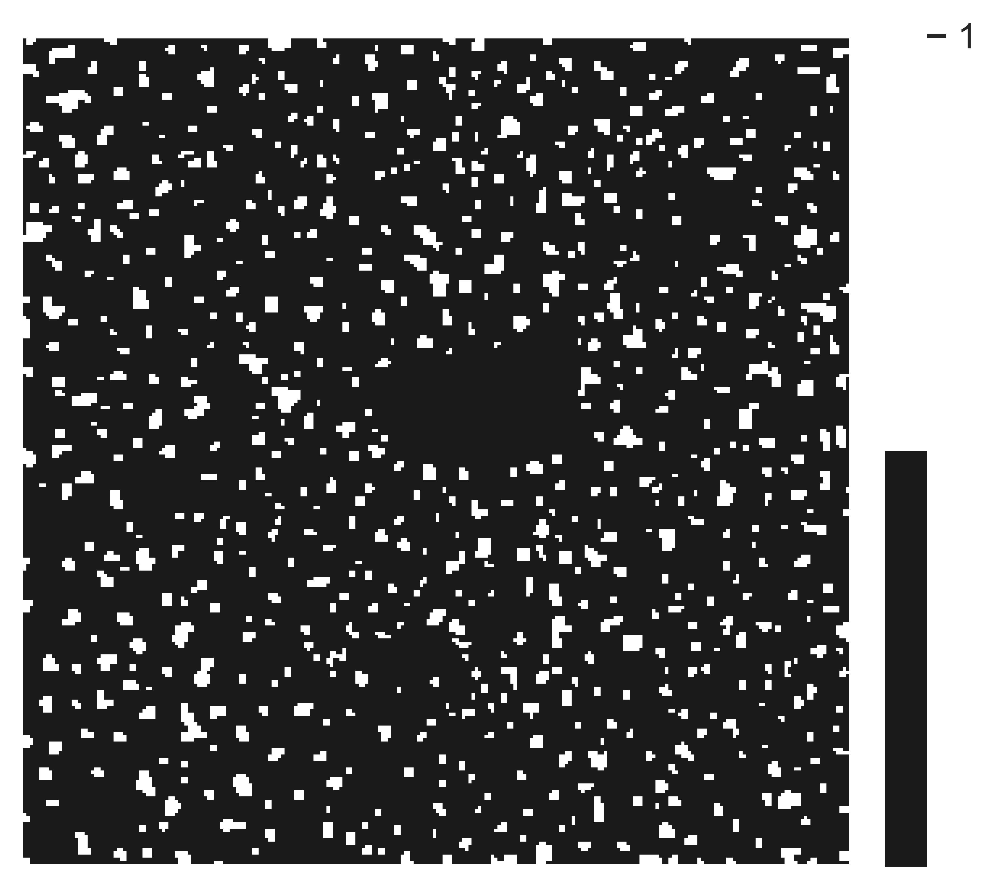

In [11]:
SEAM.pl.Cut(a, method="mask")



# ID&Cluster


In [12]:
a.uns['train_x_sample'] = a.uns['train_x'] 
a.uns['cell_idx_sample'] = a.uns['cell_idx'] 

### run SIMS-ID with epochs and temperature.


In [13]:
a = SEAM.tl.ID(a, epochs=500, t=5)



running SIMS-ID...


2022-01-19 17:45:06.666792: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-01-19 17:45:06.745951: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)


### dump intermediate results


In [14]:
a.write_h5ad("../../data/demo_dump/ID.h5ad")



### run Cluster methods with cell representation method of SIMS-ID


In [15]:
a = SEAM.tl.Cluster(a, method="SIMLR", cluster_param=5, rep="ID")



(724, 6911) 5
SIMLR highly recommends you to perform PCA first on the data

Please use the in-line function fast_pca on your input



../../../SIMLR/core.py:72: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  t = AnnoyIndex(d)
../../../SIMLR/core.py:77: FutureWarning: The default argument for metric will be removed in future version of Annoy. Please pass metric='angular' explicitly.
  u = AnnoyIndex(d)


Successfully Run SIMLR! SIMLR took 1.895631 seconds in total

done!


### umap embedding with cell representation method of SIMS-ID


In [16]:
a = SEAM.tl.Umap(a, rep="ID")



computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:00:01)
Sucessfully run Umap!


### Umap embedding colored coded by SIMLR result


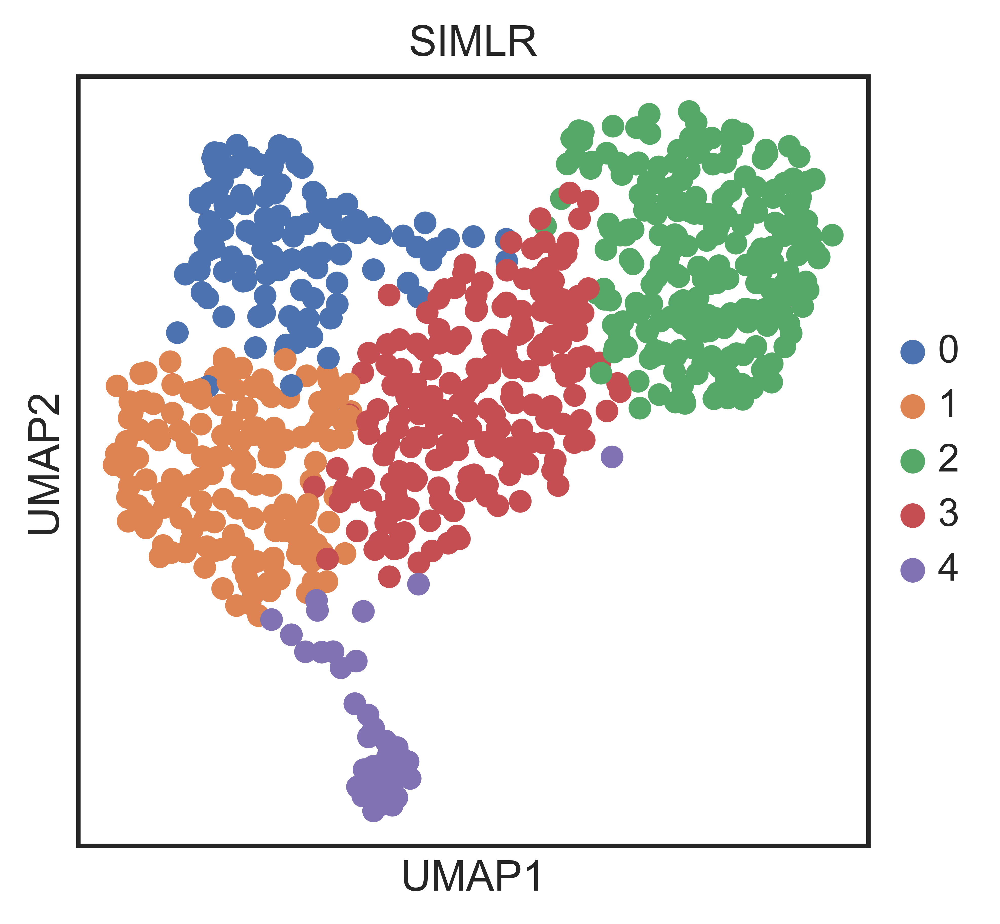

In [17]:
SEAM.pl.ID(a)


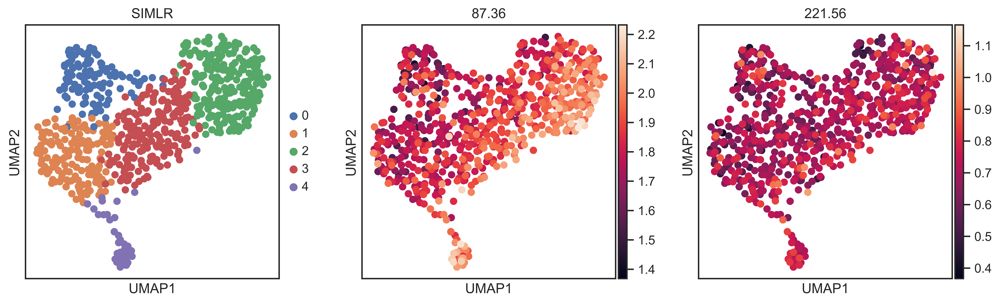

In [18]:
sc.pl.umap(a, color=["SIMLR", "87.36", "221.56"])



### spatial single cell map colored by SIMLR


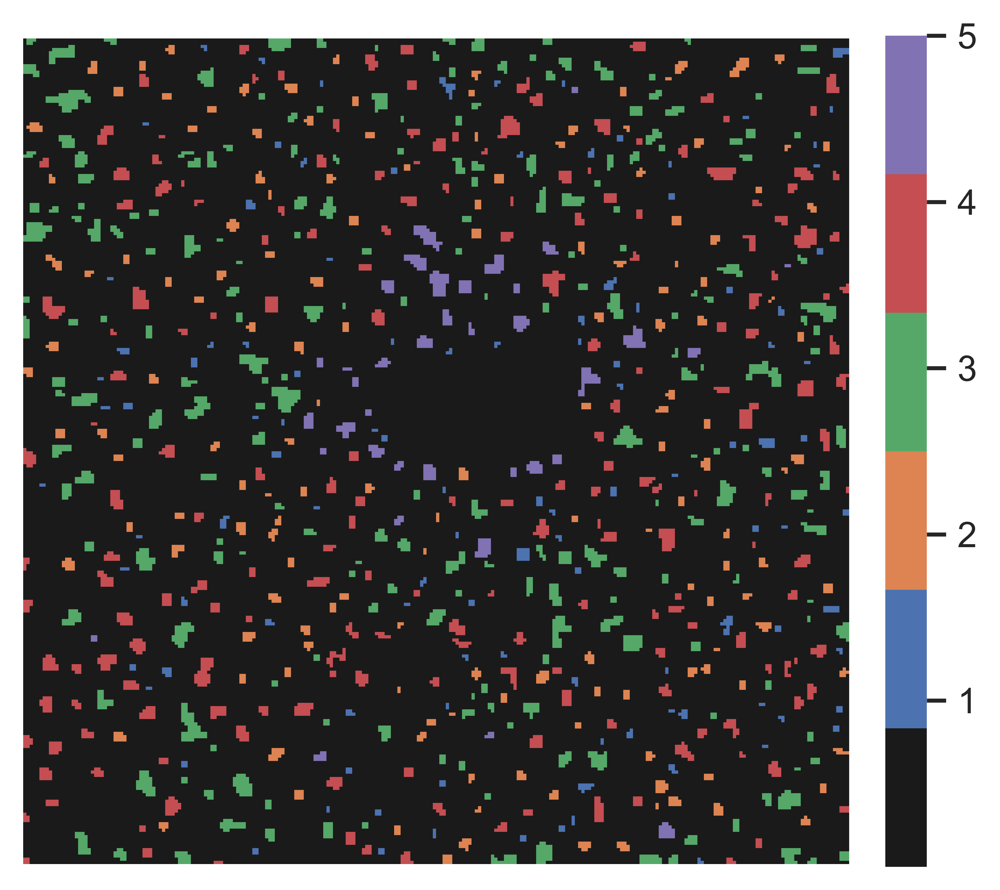

In [19]:
SEAM.pl.Cluster(a, cls="SIMLR", groups=range(5), method="mask")



### spatial single cell map of particular clusters


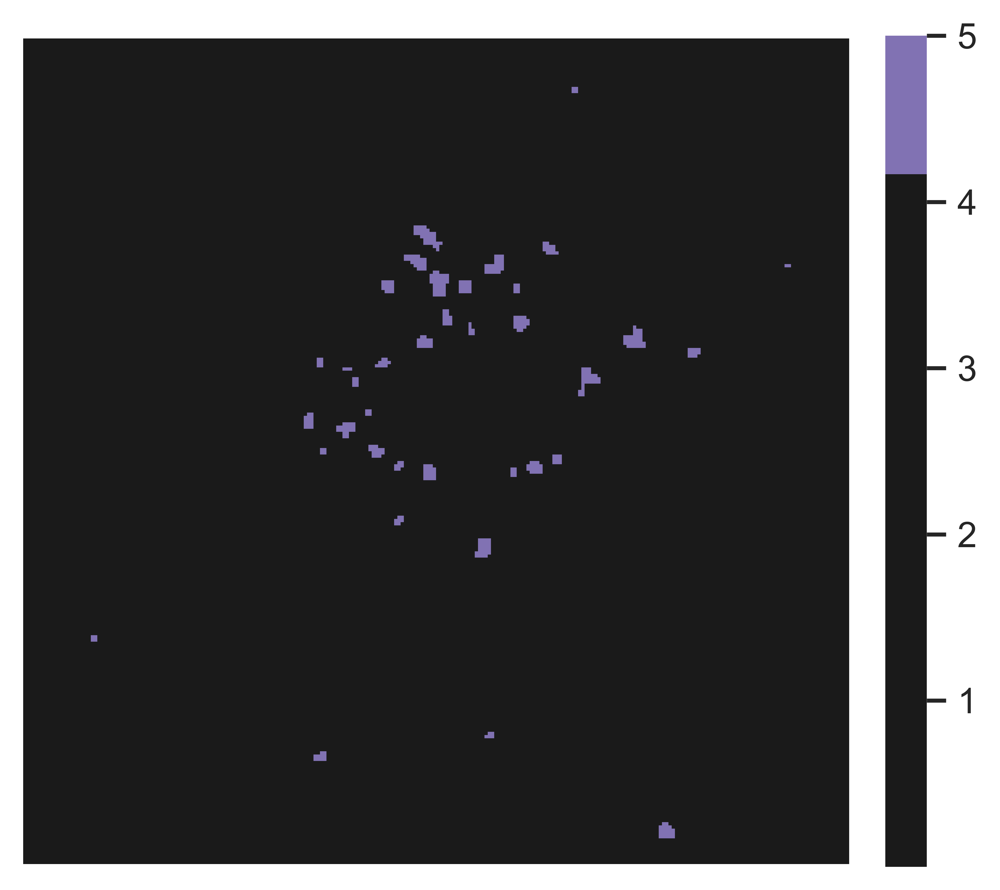

In [20]:
SEAM.pl.Cluster(a, cls="SIMLR", groups=[4], method="mask")

